Dataset - https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html

Ref - https://github.com/zhongyy/Face-Transformer

## Loading Dataset

In [11]:
import pandas as pd
attr_df = pd.read_csv('./Dataset/CelebA/Anno/list_attr_celeba.txt', delim_whitespace=True, header=1, index_col=0)
attr_df.head()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [12]:
attr_df.shape

(202599, 40)

```json
{
   "facial_feats":[
      "Arched_Eyebrows",
      "Bags_Under_Eyes",
      "Big_Lips",
      "Big_Nose",
      "Bushy_Eyebrows",
      "Double_Chin",
      "High_Cheekbones",
      "Mouth_Slightly_Open",
      "Pointy_Nose",
      "Narrow_Eyes",
      "Oval_Face",
      "Rosy_Cheeks"
   ],
   "facial_hair":[
      "5_o_Clock_Shadow",
      "Goatee",
      "Mustache",
      "No_Beard",
      "Sideburns"
   ],
   "hair_style":[
      "Bald",
      "Bangs",
      "Black_Hair",
      "Blond_Hair",
      "Brown_Hair",
      "Gray_Hair",
      "Receding_Hairline",
      "Straight_Hair",
      "Wavy_Hair"
   ],
   "aesthetics":[
      "Attractive",
      "Smiling",
      "Pale_Skin",
      "Male",
      "Young",
      "Chubby",
      "Wearing_Hat",
      "Wearing_Necktie",
      "Wearing_Necklace",
      "Wearing_Lipstick",
      "Eyeglasses",
      "Heavy_Makeup"
   ]
}
```



In [13]:
columns_list = ['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows',
       'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair',
       'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open',
       'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin',
       'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns',
       'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings',
       'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace',
       'Wearing_Necktie', 'Young']
columns_dict = {k:v for k, v in enumerate(columns_list)}

In [14]:
import random
def getattr_text(row):
    result = []
    cols = row[columns_list].to_list()

    for i, col in enumerate(cols):
      if col == 1:
         result.append(columns_dict[i])

    try:
        position = result.index('No_Beard')
        del result[position]
    except:
        pass

    return ", ".join(r for r in result)

In [28]:
from tqdm import tqdm

tqdm.pandas()
attr_df["attr_str"] = attr_df.progress_apply(getattr_text, axis=1)

100%|██████████| 202599/202599 [00:28<00:00, 7119.45it/s]


## Dataset Prview

In [29]:
attr_df.head()

,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,Blond_Hair,...,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young,attr_str,attr_str_exp
000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,-1,...,1,-1,1,-1,1,-1,-1,1,"Arched_Eyebrows, Attractive, Brown_Hair, Heavy...","Female, Arched_Eyebrows, Attractive, Brown_Hai..."
000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,1,"Bags_Under_Eyes, Big_Nose, Brown_Hair, High_Ch...","Female, Bags_Under_Eyes, Big_Nose, Brown_Hair,..."
000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,-1,...,-1,1,-1,-1,-1,-1,-1,1,"Big_Lips, Blurry, Male, Narrow_Eyes, Pointy_No...","Male, Big_Lips, Blurry, Narrow_Eyes, Pointy_No..."
000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,-1,...,1,-1,1,-1,1,1,-1,1,"Attractive, Pointy_Nose, Straight_Hair, Wearin...","Female, Attractive, Pointy_Nose, Straight_Hair..."
000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,-1,...,-1,-1,-1,-1,1,-1,-1,1,"Arched_Eyebrows, Attractive, Big_Lips, Heavy_M...","Female, Arched_Eyebrows, Attractive, Big_Lips,..."


In [30]:
attr_df.index.name = 'image_id'
attr_df.reset_index(inplace=True)

In [21]:
# sample_df = attr_df.sample(6)
# image_ids =  sample_df.iloc[:, 0].to_list()

In [23]:
# sample_df.index.name = 'image_id'
# sample_df.reset_index(inplace=True)

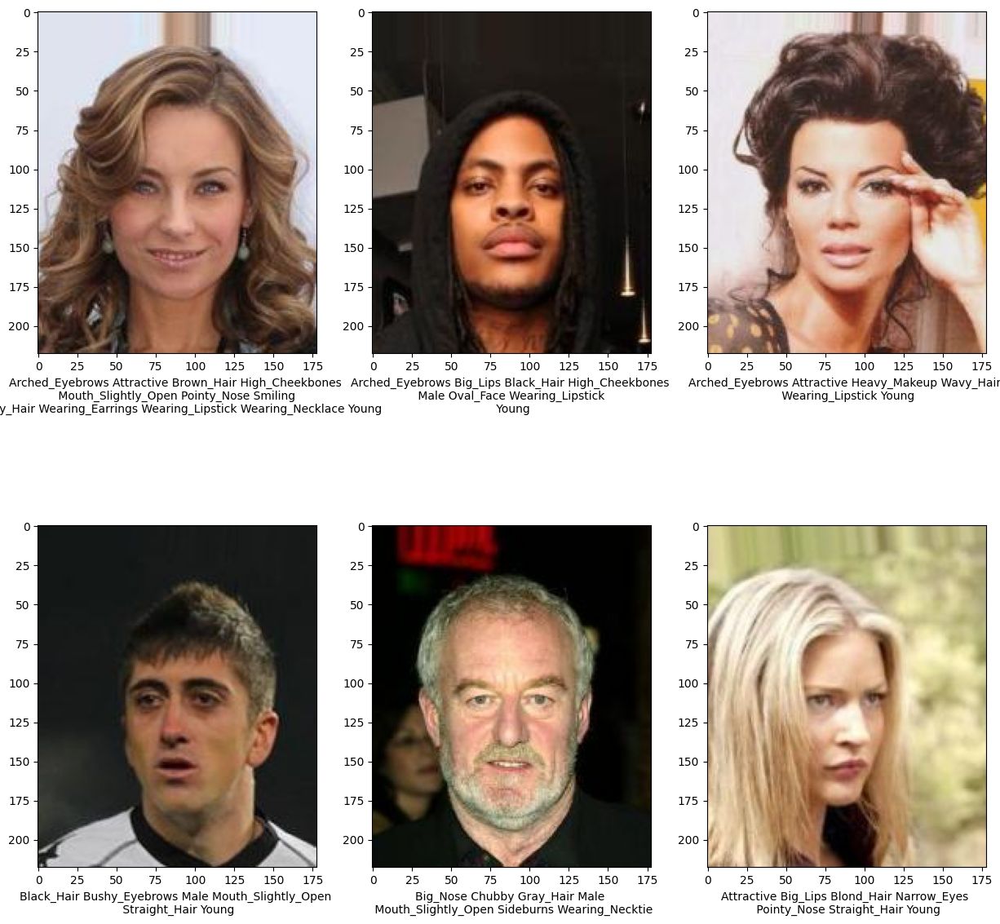

In [31]:
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import os

sample_df = attr_df.sample(6)
img_folder = "./Dataset/CelebA/Img/img_align_celeba/img_align_celeba"
image_ids =  sample_df["image_id"].to_list()
image_names = [os.path.join(img_folder, image_id) for image_id in image_ids]
image_attrs=  sample_df[sample_df["image_id"].isin(image_ids)]["attr_str"]
formatted_image_attrs = []
for image_attr in image_attrs:
    attrs = image_attr.split(", ")
    x = 4
    i = 0
    while i < len(attrs):
        attrs.insert(x, "\n")
        x += 4
        i += x
    formatted_image_attrs.append(' '.join(attr for attr in attrs))

_, axes = plt.subplots(2, 3, figsize=(15, 15))
for image_name, image_attr, ax in zip(image_names, formatted_image_attrs, axes.flatten()):

    image = cv2.imread(image_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    ax.set_xlabel(str(image_attr))
    ax.imshow(image)

plt.show()

In [32]:
attr_df["attr_str_exp"] = attr_df["attr_str"].apply(lambda x : "Male@ " + x if "Male" in x else "Female, " + x)
attr_df["attr_str_exp"] = attr_df["attr_str_exp"].apply(lambda x : x.replace(" Male,", "") if " Male," in x else x)
attr_df["attr_str_exp"] = attr_df["attr_str_exp"].apply(lambda x : x.replace("Male,", "") if "Male," in x else x)
attr_df["attr_str_exp"] = attr_df["attr_str_exp"].apply(lambda x : x.replace(" Male", "") if " Male" in x else x)
attr_df["attr_str_exp"] = attr_df["attr_str_exp"].apply(lambda x : x.replace("Male@", "Male,") if "Male@" in x else x)

In [33]:
print(attr_df.shape)
attr_exceptions = attr_df[attr_df.attr_str_exp.str.contains("Female, 5_o_Clock_Shadow")]["image_id"].to_list()
attr_df = attr_df[~attr_df["image_id"].isin(attr_exceptions)]
print(attr_df.shape)

(202599, 43)
(202579, 43)


In [37]:
data_parts = pd.read_csv('./Dataset/CelebA/Eval/list_eval_partition.txt', delim_whitespace=True, header=None)

In [39]:
data_parts.columns = ["image_id", "partition"]

In [40]:
# data_parts = pd.read_csv("./CelebA/Eval/list_eval_partition.csv")
# read from partion.txt file
# data_parts = pd.read_csv('./Dataset/CelebA/Eval/list_eval_partition.txt', delim_whitespace=True, header=None)
train_ids = data_parts[data_parts.partition == 0]["image_id"].to_list()
eval_ids = data_parts[data_parts.partition == 1]["image_id"].to_list()
test_ids = data_parts[data_parts.partition == 2]["image_id"].to_list()
train_df = attr_df[attr_df.image_id.isin(train_ids)]
eval_df = attr_df[attr_df.image_id.isin(eval_ids)]
test_df = attr_df[attr_df.image_id.isin(test_ids)]

In [41]:
train_male_samples = train_df[train_df["attr_str"].str.contains("Male")]
train_female_samples = train_df[~train_df["attr_str"].str.contains("Male")]

eval_male_samples = eval_df[eval_df["attr_str"].str.contains("Male")]
eval_female_samples = eval_df[~eval_df["attr_str"].str.contains("Male")]

In [42]:
hard_negatives = {
'5_o_Clock_Shadow': "No_",
'Arched_Eyebrows': "No_",
'Attractive': "Not_",
'Bags_Under_Eyes': "No_",
'Bald': "Not_",
'Bangs': "No_",
'Big_Lips': "Not_",
'Big_Nose': "Not_",
'Black_Hair': "Not_",
'Blond_Hair': "Not_",
'Blurry': "Not_",
'Brown_Hair': "Not_",
'Bushy_Eyebrows': "Not_",
'Chubby': "Not_",
'Double_Chin': "No_",
'Eyeglasses':"No_",
'Goatee': "No_",
'Gray_Hair': "Not_",
'Heavy_Makeup': "No_",
'High_Cheekbones': "No_",
'Male': "Female",
'Mouth_Slightly_Open': "Mouth_Not_Slightly_Open",
'Mustache': "No_",
'Narrow_Eyes': "No_",
'Oval_Face': "Not_",
'Pale_Skin': "Not_",
'Pointy_Nose': "Not_",
'Receding_Hairline': "No_",
'Rosy_Cheeks' : "No_",
'Sideburns': "No_",
'Smiling': "Not_",
'Straight_Hair': "No_",
'Wavy_Hair':"No_",
'Wearing_Earrings':"Not_",
'Wearing_Hat':"Not_",
'Wearing_Lipstick':"Not_",
'Wearing_Necklace':"Not_",
'Wearing_Necktie':"Not_",
'Young':"Not_",
}

In [44]:
def gen_triplets(df, male_samples, female_samples):

    import random
    triples= []

    for i, row in tqdm(df.iterrows(), total=df.shape[0]):

        if row["attr_str"] == "":
           continue

        flipped = set()

        """
        Easy triples - Random
        """
        if "Male" in row["attr_str"]:
            negatives = female_samples.sample(1)
        else:
            negatives = male_samples.sample(1)

        for j, negative in negatives.iterrows():
            # Add anchor A and Positive P
            triple = {}
            triple = {"image_id": row["image_id"], "pos": row["attr_str_exp"]}
            # Add Negative N
            triple["neg"] = negative["attr_str_exp"]
            triple["mode"] = "easy"
            triples.append(triple)
        """
        Semi-hard triples by getting a random same gender record but unmatching attributes, N times
        """
        count = 0
        max_semi_hard = 2
        while count < max_semi_hard:
            semi_hard_found = False
            while not semi_hard_found:
                if "Male" in row["attr_str"]:
                    negatives = male_samples.sample(1)
                else:
                    negatives = female_samples.sample(1)

                for j, negative in negatives.iterrows():
                      # Add anchor A and Positive P
                      triple = {}
                      triple = {"image_id": row["image_id"], "pos": row["attr_str_exp"]}
                      # Add Negative N
                      if row[columns_list].to_list() != negative[columns_list].to_list():
                          triple["neg"] = negative["attr_str_exp"]
                          triples.append(triple)
                          triple["mode"] = "semi"
                          semi_hard_found = True
                          count += 1
        """
        Hard triples by flipping 1 to 2 attributes of the positive attributes
        """

        max_flips = random.randint(1,2)
        count = 0
        flipped = set()
        visited_attribs = set()
        exit = False
        triple = {}
        triple = {"image_id": row["image_id"], "pos": row["attr_str_exp"]}

        while count < max_flips:

              attribs = row["attr_str"].split(", ")
              # print("attribs", attribs)

              while True:

                  random_attrib = random.choice(attribs)

                  if random_attrib not in visited_attribs:
                      visited_attribs.add(random_attrib)
                      if random_attrib == "Male" and ("5_o_Clock_Shadow" in attribs or "Goatee"   in attribs \
                          or "Mustache" in attribs or "Sideburns" in attribs):
                          continue
                      else:
                        break
                  else:
                    if set(attribs) == visited_attribs:
                      exit = True
                      break

              if exit:
                  break

              if random_attrib not in flipped:

                  # print("Working with", random_attrib)
                  if random_attrib in hard_negatives:

                    flipped.add(random_attrib)
                    count += 1
                    neg_attrib = hard_negatives[random_attrib]

                    if neg_attrib.endswith("_"):
                        flipped_attrib = neg_attrib + random_attrib
                    else:
                        flipped_attrib = neg_attrib

                    # print("Flipped is ", flipped_attrib)
                    if "neg" not in triple:
                        hard_neg_str = row["attr_str_exp"].replace(random_attrib, flipped_attrib)
                    else:
                        hard_neg_str = triple["neg"].replace(random_attrib, flipped_attrib)
                    # print("Neg is ", hard_neg_str)
                    triple["mode"] = "hard"
                    triple["neg"] = hard_neg_str
              else:
                  if set(attribs) == flipped:
                    break

        # Add Hard Negative N
        triples.append(triple)

    return triples

In [45]:
train_triplet_df = pd.DataFrame(gen_triplets(train_df, train_male_samples, train_female_samples))
eval_triplet_df = pd.DataFrame(gen_triplets(eval_df, eval_male_samples, eval_female_samples))

100%|██████████| 19865/19865 [00:26<00:00, 746.06it/s]


In [46]:
train_exceptions = train_triplet_df[train_triplet_df["neg"].isna()]["image_id"].to_list()
eval_exceptions = eval_triplet_df[eval_triplet_df["neg"].isna()]["image_id"].to_list()
train_triplet_df = train_triplet_df[~train_triplet_df["image_id"].isin(train_exceptions)]
eval_triplet_df = eval_triplet_df[~eval_triplet_df["image_id"].isin(eval_exceptions)]

In [47]:
train_triplet_df["pos"] = train_triplet_df["pos"].apply(lambda x: x.replace("5_o_Clock_Shadow", "5o_Clock_Shadow"))
train_triplet_df["pos"] = train_triplet_df["pos"].apply(lambda x: x.replace("_", " "))
train_triplet_df["neg"] = train_triplet_df["neg"].apply(lambda x: x.replace("5_o_Clock_Shadow", "5o_Clock_Shadow"))
train_triplet_df["neg"] = train_triplet_df["neg"].apply(lambda x: x.replace("_", " "))

eval_triplet_df["pos"] = eval_triplet_df["pos"].apply(lambda x: x.replace("5_o_Clock_Shadow", "5o_Clock_Shadow"))
eval_triplet_df["pos"] = eval_triplet_df["pos"].apply(lambda x: x.replace("_", " "))
eval_triplet_df["neg"] = eval_triplet_df["neg"].apply(lambda x: x.replace("5_o_Clock_Shadow", "5o_Clock_Shadow"))
eval_triplet_df["neg"] = eval_triplet_df["neg"].apply(lambda x: x.replace("_", " "))

In [48]:
train_triplet_df.reset_index(drop=True, inplace=True)
eval_triplet_df.reset_index(drop=True, inplace=True)

In [49]:
print(train_triplet_df.shape)
print(eval_triplet_df.shape)

(650964, 4)
(79444, 4)


In [50]:
train_triplet_df["mode"].value_counts()

mode
semi    325482
easy    162741
hard    162741
Name: count, dtype: int64

In [51]:
pd.set_option('max_colwidth', None)
train_triplet_df.head(4)

,image_id,pos,neg,mode
0,000001.jpg,"Female, Arched Eyebrows, Attractive, Brown Hair, Heavy Makeup, High Cheekbones, Mouth Slightly Open, Pointy Nose, Smiling, Straight Hair, Wearing Earrings, Wearing Lipstick, Young","Male, Big Nose, High Cheekbones, Mouth Slightly Open, Smiling, Wavy Hair, Young",easy
1,000001.jpg,"Female, Arched Eyebrows, Attractive, Brown Hair, Heavy Makeup, High Cheekbones, Mouth Slightly Open, Pointy Nose, Smiling, Straight Hair, Wearing Earrings, Wearing Lipstick, Young","Female, Arched Eyebrows, Attractive, Blond Hair, Heavy Makeup, Pointy Nose, Wavy Hair, Wearing Lipstick, Wearing Necklace, Young",semi
2,000001.jpg,"Female, Arched Eyebrows, Attractive, Brown Hair, Heavy Makeup, High Cheekbones, Mouth Slightly Open, Pointy Nose, Smiling, Straight Hair, Wearing Earrings, Wearing Lipstick, Young","Female, Attractive, Brown Hair, Heavy Makeup, Oval Face, Pointy Nose, Smiling, Wearing Lipstick, Young",semi
3,000001.jpg,"Female, Arched Eyebrows, Attractive, Brown Hair, Heavy Makeup, High Cheekbones, Mouth Slightly Open, Pointy Nose, Smiling, Straight Hair, Wearing Earrings, Wearing Lipstick, Young","Female, Arched Eyebrows, Attractive, Brown Hair, Heavy Makeup, High Cheekbones, Mouth Slightly Open, Pointy Nose, Smiling, Straight Hair, Wearing Earrings, Not Wearing Lipstick, Young",hard


## Preparing Dataset

In [55]:
from utils.visualhuntdataset import FaceFetchDataset

train_dataset = FaceFetchDataset(
                           root_dir='./Dataset/CelebA/Img/img_align_celeba/img_align_celeba',
                           df=train_triplet_df,
                           nn_arch = "TRN"
                            )

dev_dataset = FaceFetchDataset(
                           root_dir='./Dataset/CelebA/Img/img_align_celeba/img_align_celeba',
                           df=eval_triplet_df,
                           nn_arch = "TRN"
                            )

from torch.utils.data import DataLoader, RandomSampler, SequentialSampler

batch_size = 64
eval_batch_size = 64
dataloader_train = DataLoader(train_dataset,
                              sampler=SequentialSampler(train_dataset),
                              batch_size=batch_size)
dataloader_validation = DataLoader(dev_dataset,
                                   sampler=SequentialSampler(dev_dataset),
                                   batch_size=eval_batch_size)

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

C:\Users\ishan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\huggingface_hub\file_download.py:149: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\ishan\.cache\huggingface\hub\models--google--vit-base-patch16-224-in21k. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

C:\Users\ishan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\models\vit\feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [56]:
next(iter(dataloader_train))["anchor"]["pixel_values"].shape # when using HF models
#next(iter(dataloader_train))["anchor"].shape # when using CNNs or custom models

torch.Size([64, 3, 224, 224])

## Testing the Model

In [64]:
import torch
device = "cuda:0" if torch.cuda.is_available() else "cpu"

In [65]:
device

'cuda:0'

In [58]:
from model.visualhunt import VisualHuntNetwork

device = "cuda:0" if torch.cuda.is_available() else "cpu"
# To use Transformer for Vision
model = VisualHuntNetwork(hyperparms={"device": device, "nn_arch": "TRN", "model_name": "google/vit-base-patch16-224-in21k", "vision_dim": 768, "text_dim": 768, "proj_dim": 512})
model.to(device)
print()

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

C:\Users\ishan\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\huggingface_hub\file_download.py:149: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\ishan\.cache\huggingface\hub\models--sentence-transformers--all-mpnet-base-v2. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

Additional recommended metric to track learning effectiveness and/or for early stopping
```python
   if distance(Anchor, Neg) - distance(Anchor, Pos) > Margin:
      correct += 1     
```   

In [ ]:
device = "cuda:0"
model.load_state_dict(torch.load('./models/ViT_facefetch_epoch_4.model'))
model.to(device)
print()

In [ ]:
test_df.reset_index(drop=True, inplace=True)
test_df = test_df[["image_id", "attr_str_exp"]]
neg_df = pd.DataFrame([""] * test_df.shape[0], columns=["neg"]) # Neg is dummy as our dataset expects pairs, could have been conditioned FaceFetchDataset, sorry just lazy
test_df = pd.concat([test_df, neg_df], axis=1)
test_df.columns = ["image_id", "pos", "neg"]
test_df["pos"] = test_df["pos"].apply(lambda x: x.replace("5_o_Clock_Shadow", "5o_Clock_Shadow"))
test_df["pos"] = test_df["pos"].apply(lambda x: x.replace("_", " "))
test_df.sample(5)

,image_id,pos,neg
6479,189117.jpg,"Female, Arched Eyebrows, Big Lips, Big Nose, B...",
12145,194783.jpg,"Male, Bags Under Eyes, Big Lips, Big Nose, Goa...",
15130,197768.jpg,"Female, Bags Under Eyes, Bangs, Big Lips, Big ...",
18196,200834.jpg,"Male, Brown Hair, Bushy Eyebrows, High Cheekbo...",
16607,199245.jpg,"Female, Attractive, Heavy Makeup, High Cheekbo...",


In [ ]:
from torch.utils.data import DataLoader, SequentialSampler

test_dataset = FaceFetchDataset(
                           root_dir='./Dataset/CelebA/Img/img_align_celeba/img_align_celeba',
                           df=test_df,
                           nn_arch = "TRN"
                            )


test_batch_size = 128
dataloader_test = DataLoader(test_dataset,
                                   sampler=SequentialSampler(test_dataset),
                                   batch_size=test_batch_size)

In [ ]:
def get_image_embeddings():
    model.eval()
    test_image_embeddings = []
    image_names = []
    with torch.no_grad():
        for batch in tqdm(dataloader_test):
            #image_features = model.image_encoder(batch["anchor"].to(device)) # Uncomment for CNN based models
            image_features = model.image_encoder(batch["anchor"])             # Uncomment for TRN based models
            image_names.extend(batch["image_name"])
            image_embeddings = model.vision_projection(image_features)
            test_image_embeddings.append(image_embeddings)
    return image_names, torch.cat(test_image_embeddings)

In [ ]:
image_names, image_embeddings = get_image_embeddings()

100%|██████████| 156/156 [01:17<00:00,  2.01it/s]


In [ ]:
from sentence_transformers import SentenceTransformer, util
from IPython.display import Image as IPImage
import cv2
import matplotlib.pyplot as plt


img_folder = "./Dataset/CelebA/Img/img_align_celeba/img_align_celeba"

def search(query, image_embeddings, img_names, k=3):
    query_emb = model.text_encoder(query)
    query_emb = model.text_projection(query_emb)
    hits = util.semantic_search(query_emb, image_embeddings, top_k=k)[0]
    print("query:", query)

    _, axes = plt.subplots(int(k // 3), 3, figsize=(15, 15))
    for hit, ax in zip(hits, axes.flatten()):
        img_name= img_names[hit['corpus_id']]
        image = cv2.imread(os.path.join(img_folder, img_name))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.set_xlabel("score: " + str(round(hit["score"],3)) + ", Name:" + img_name)
        ax.imshow(image)

    plt.show()


## Results

query: Male, Attractive, Young, Brown Hair, Smiling, Wavy Hair, 5o Clock Shadow


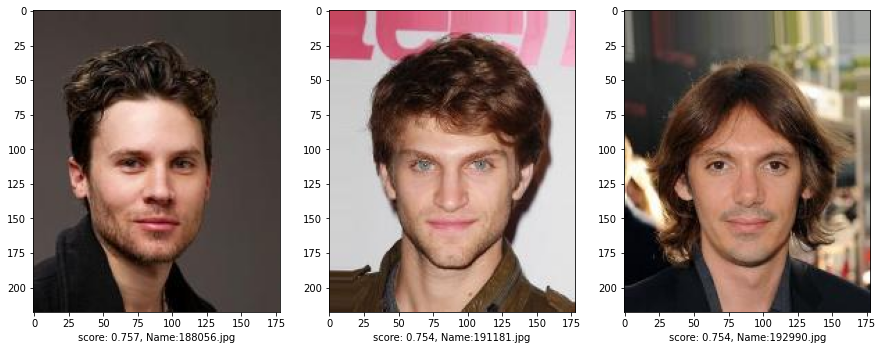

In [ ]:
search("Male, Attractive, Young, Brown Hair, Smiling, Wavy Hair, 5o Clock Shadow", image_embeddings, image_names, 3)

query: Male, Attractive, Young, Black Hair, Smiling, Wavy Hair, 5o Clock Shadow


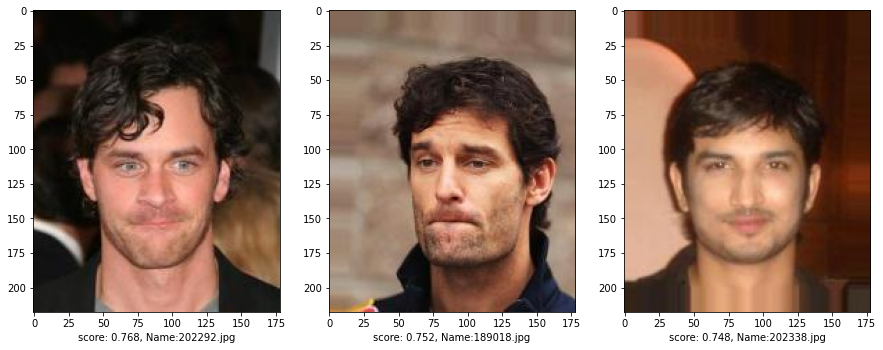

In [ ]:
search("Male, Attractive, Young, Black Hair, Smiling, Wavy Hair, 5o Clock Shadow", image_embeddings, image_names, 3)

query: Female, Black Hair, High Cheekbones, Oval Face, Pointy Nose, Smiling, Wearing Earrings, Wearing Lipstick, Young


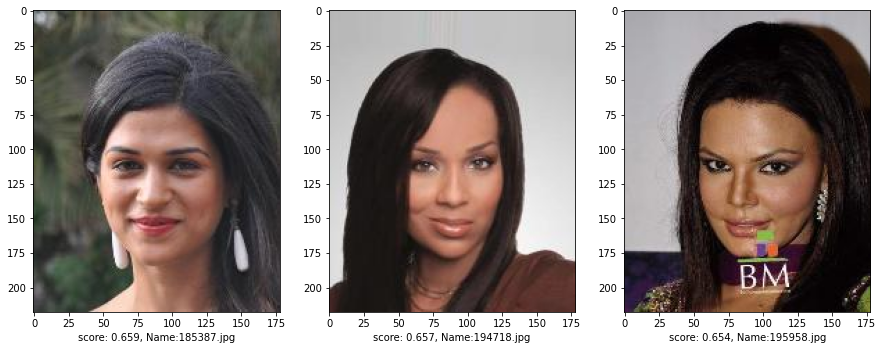

In [ ]:
search("Female, Black Hair, High Cheekbones, Oval Face, Pointy Nose, Smiling, Wearing Earrings, Wearing Lipstick, Young", image_embeddings, image_names, 3)

query: Female, Black Hair, High Cheekbones, Oval Face, Pointy Nose, Smiling, Wearing Earrings, Wearing Lipstick, Young


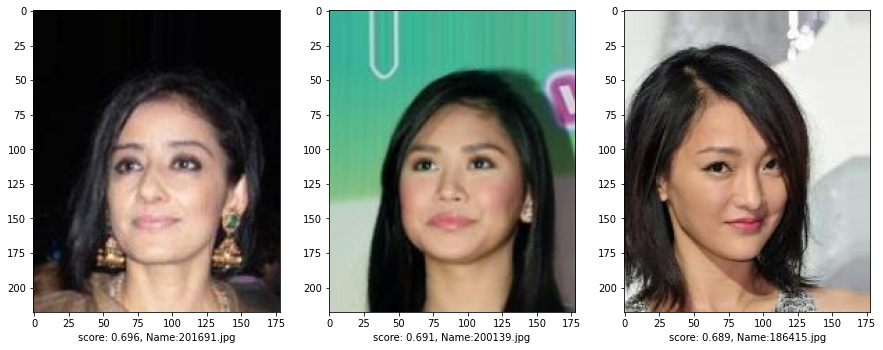

In [ ]:
search("Female, Black Hair, High Cheekbones, Oval Face, Pointy Nose, Smiling, Wearing Earrings, Wearing Lipstick, Young", image_embeddings, image_names, 3)

query: Female, Chubby, Mouth Slightly Open, Wearing Lipstick, Smiling


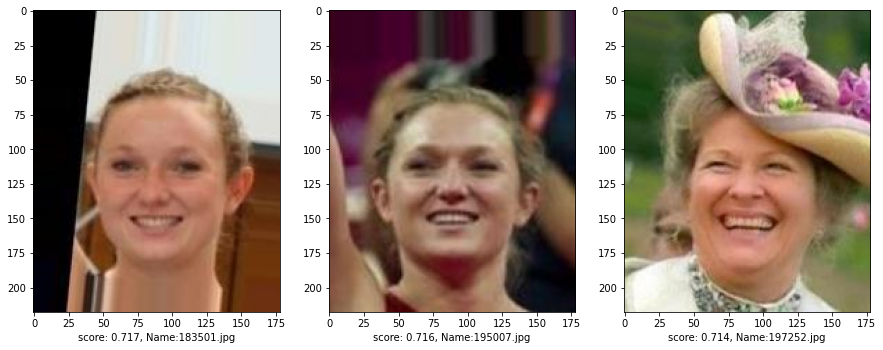

In [ ]:
search("Female, Chubby, Mouth Slightly Open, Wearing Lipstick, Smiling", image_embeddings, image_names, 3)

query: Female, Chubby, Mouth Slightly Open, Wearing Lipstick, Smiling


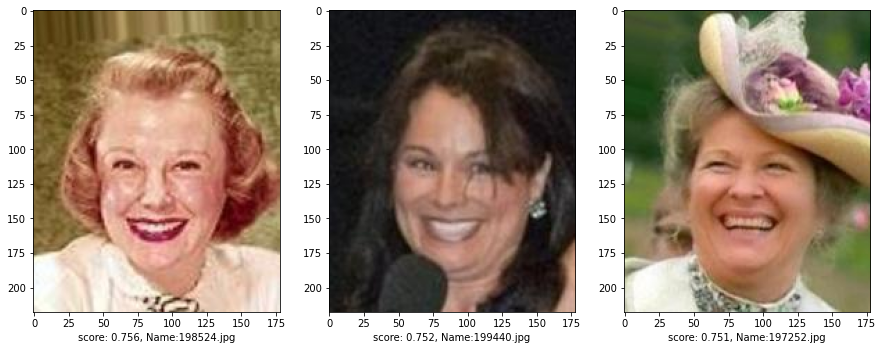

In [ ]:
search("Female, Chubby, Mouth Slightly Open, Wearing Lipstick, Smiling", image_embeddings, image_names, 3)

query: Male, Bald, Eyeglasses, Sideburns, Mustache, Attractive


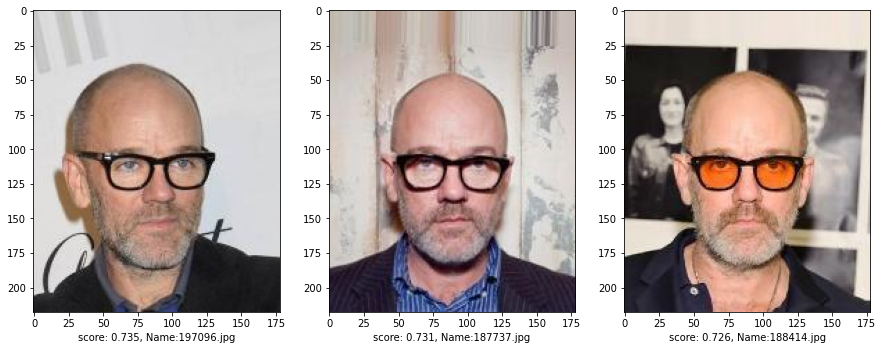

In [ ]:
search("Male, Bald, Eyeglasses, Sideburns, Mustache, Attractive", image_embeddings, image_names, 3)

query: Female, Wearing Lipstick, Blonde Hair, Straight Hair, Attractive, Young


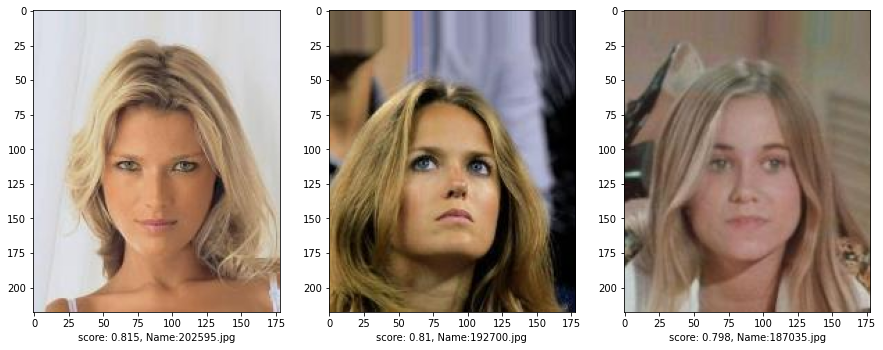

In [ ]:
search("Female, Wearing Lipstick, Blonde Hair, Straight Hair, Attractive, Young", image_embeddings, image_names, 3)

query: Female, Wearing Lipstick, Blonde Hair, Straight Hair, Attractive, Young


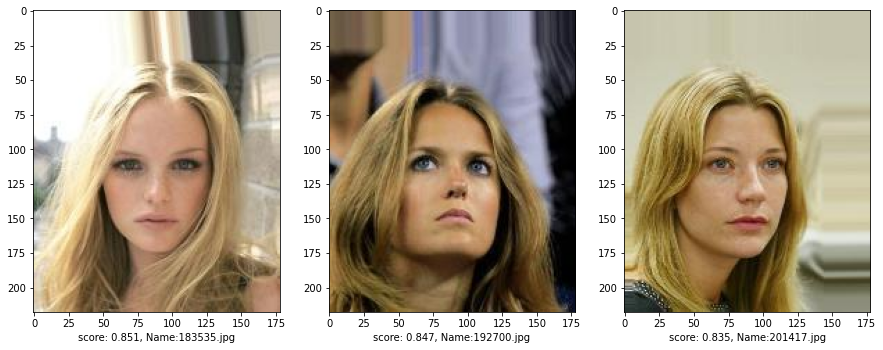

In [ ]:
search("Female, Wearing Lipstick, Blonde Hair, Straight Hair, Attractive, Young", image_embeddings, image_names, 3)

query: Male, Smiling, 5o Clock Shadow, Bags Under Eyes, Wearing Necktie


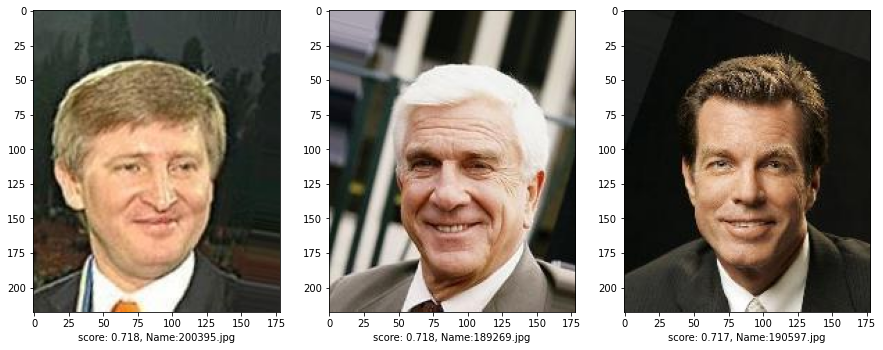

In [ ]:
search("Male, Smiling, 5o Clock Shadow, Bags Under Eyes, Wearing Necktie", image_embeddings, image_names, 3)

query: Male, Smiling, 5o Clock Shadow, Bags Under Eyes, Wearing Necktie


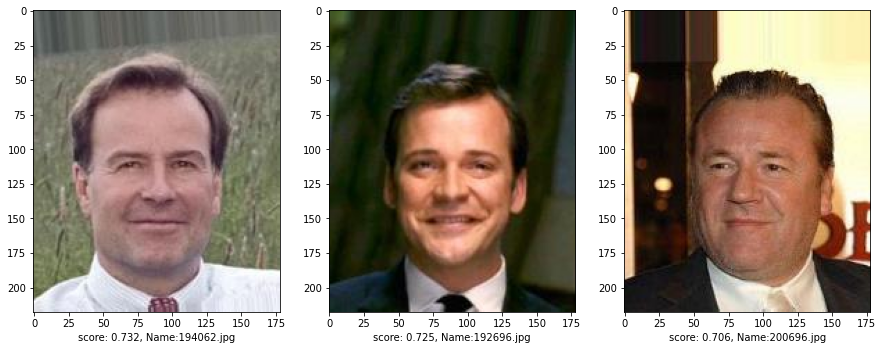

In [ ]:
search("Male, Smiling, 5o Clock Shadow, Bags Under Eyes, Wearing Necktie", image_embeddings, image_names, 3)

query: Male, High Cheekbones, Smiling, Oval Face, Black Hair


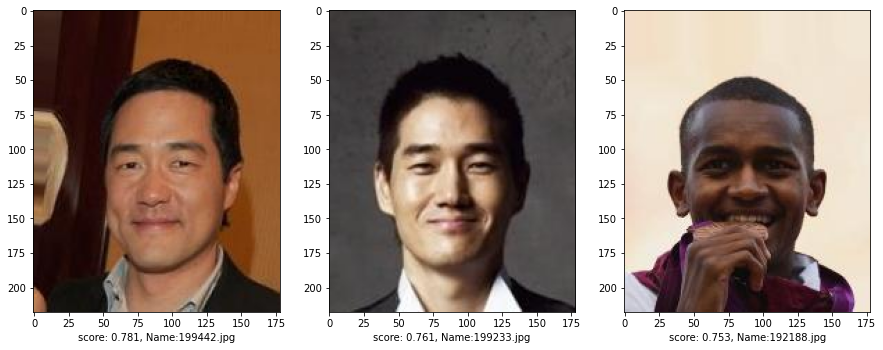

In [ ]:
search("Male, High Cheekbones, Smiling, Oval Face, Black Hair", image_embeddings, image_names, 3)

query: Male, High Cheekbones, Smiling, Oval Face, Black Hair


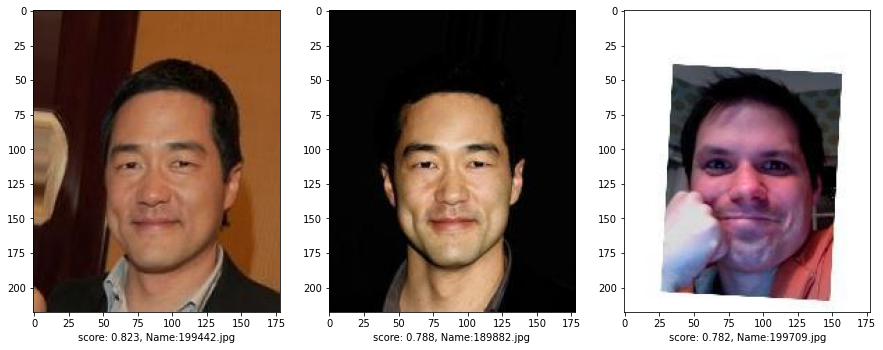

In [ ]:
search("Male, High Cheekbones, Smiling, Oval Face, Black Hair", image_embeddings, image_names, 3)

query: Female, Arched Eyebrows, Wearing Lipstick, Heavy Makeup


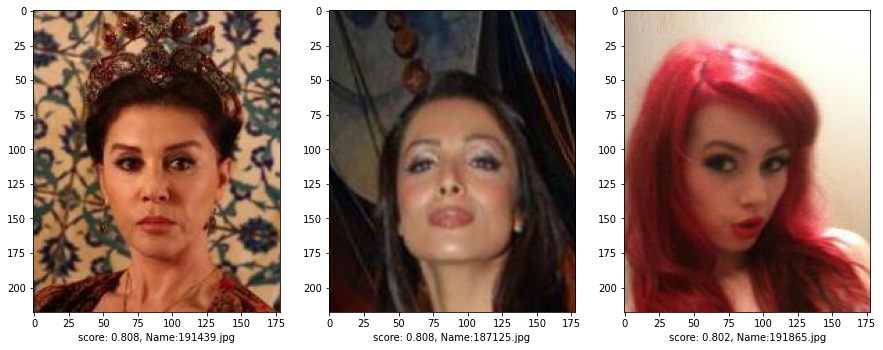

In [ ]:
search("Female, Arched Eyebrows, Wearing Lipstick, Heavy Makeup", image_embeddings, image_names, 3)

query: Female, Arched Eyebrows, Wearing Lipstick, Heavy Makeup


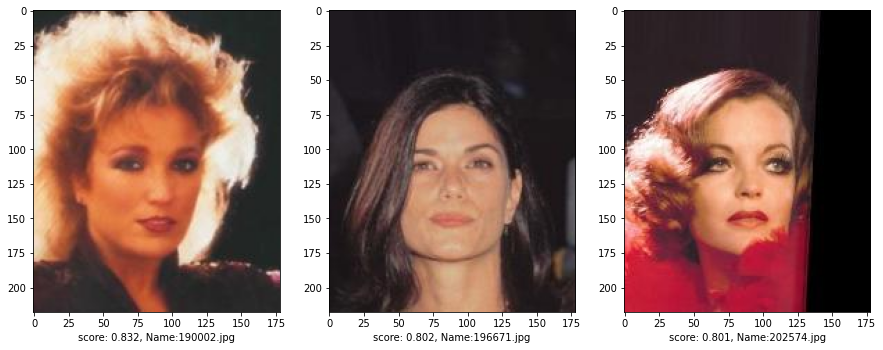

In [ ]:
search("Female, Arched Eyebrows, Wearing Lipstick, Heavy Makeup", image_embeddings, image_names, 3)

query: Male, Sideburns, Mustache, Goatee


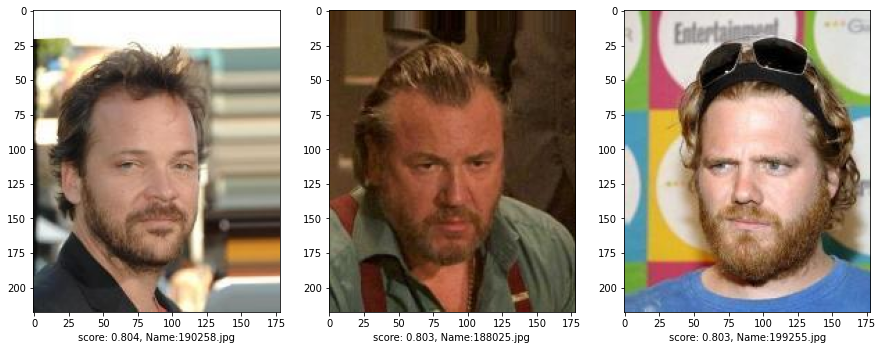

In [ ]:
search("Male, Sideburns, Mustache, Goatee", image_embeddings, image_names, 3)

query: Male, Sideburns, Mustache, Goatee


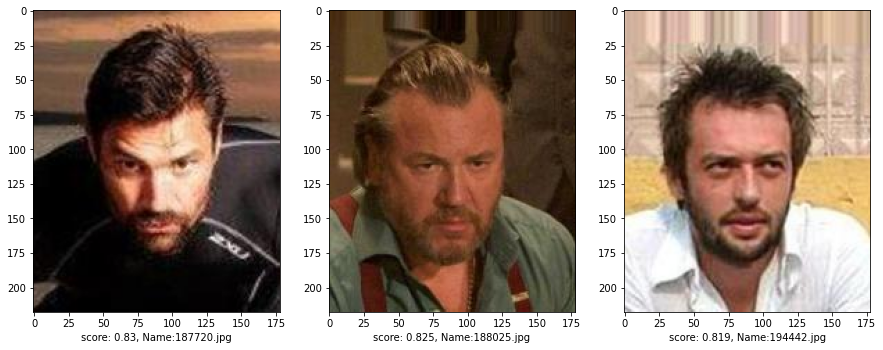

In [ ]:
search("Male, Sideburns, Mustache, Goatee", image_embeddings, image_names, 3)

query: Female, Arched Eyebrows, Wearing Lipstick, Mouth Slightly Open, Smiling, Blond Hair


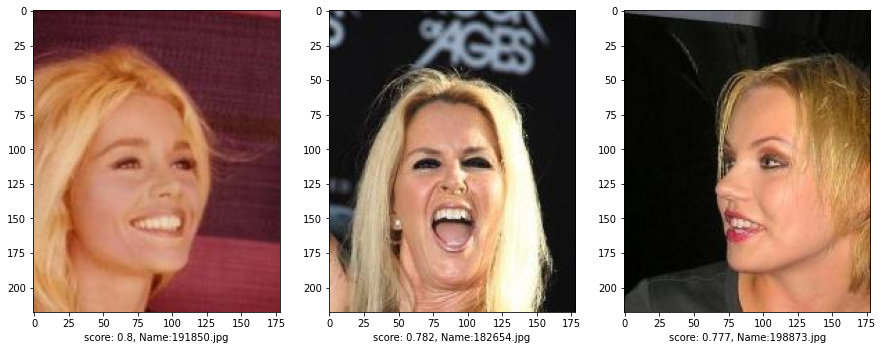

In [ ]:
search("Female, Arched Eyebrows, Wearing Lipstick, Mouth Slightly Open, Smiling, Blond Hair", image_embeddings, image_names, 3)

query: Female, Arched Eyebrows, Wearing Lipstick, Mouth Slightly Open, Smiling, Blond Hair


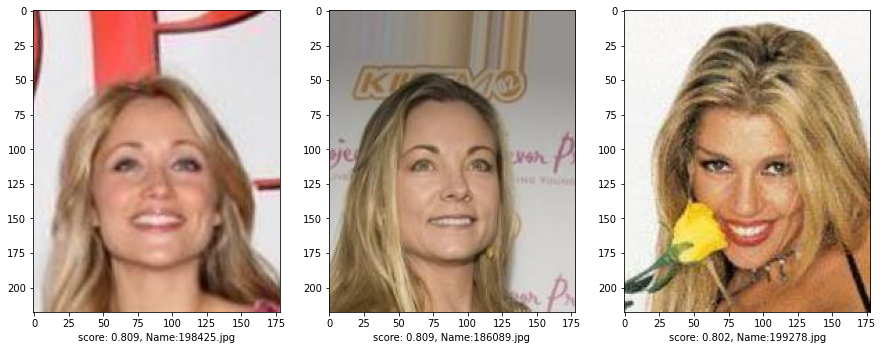

In [ ]:
search("Female, Arched Eyebrows, Wearing Lipstick, Mouth Slightly Open, Smiling, Blond Hair", image_embeddings, image_names, 3)

query: Female, Bangs, Blond Hair, High Cheekbones, Oval Face, Smiling, Wavy Hair, Wearing Lipstick


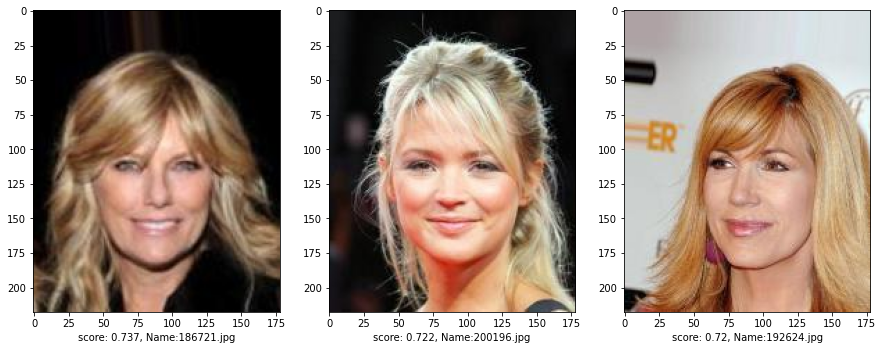

In [ ]:
search("Female, Bangs, Blond Hair, High Cheekbones, Oval Face, Smiling, Wavy Hair, Wearing Lipstick", image_embeddings, image_names, 3)

query: Female, Bangs, Blond Hair, High Cheekbones, Oval Face, Smiling, Wavy Hair, Wearing Lipstick


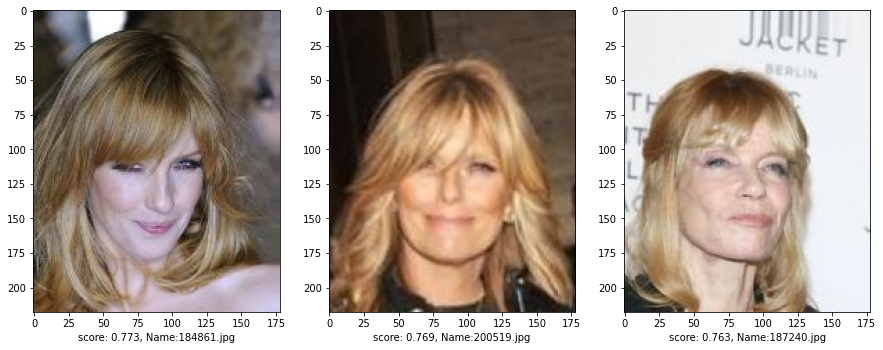

In [ ]:
search("Female, Bangs, Blond Hair, High Cheekbones, Oval Face, Smiling, Wavy Hair, Wearing Lipstick", image_embeddings, image_names, 3)

query: Male, Mustache, Wearing Hat


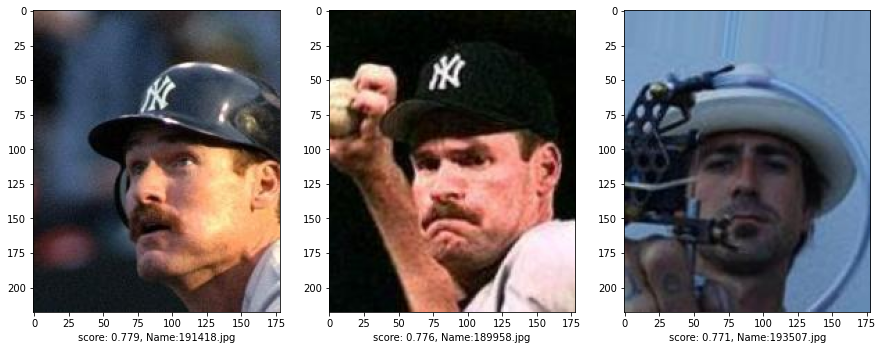

In [ ]:
search("Male, Mustache, Wearing Hat", image_embeddings, image_names, 3)

query: Male, Mustache, Wearing Hat


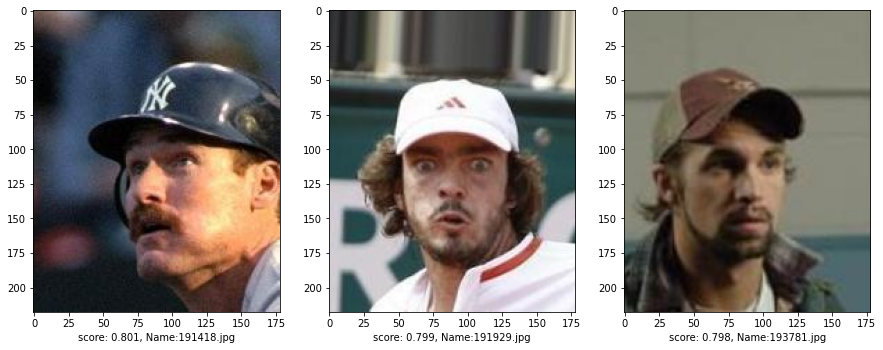

In [ ]:
search("Male, Mustache, Wearing Hat", image_embeddings, image_names, 3)

# Image + Text Input

In [ ]:
from sentence_transformers import SentenceTransformer, util
from IPython.display import Image as IPImage
import cv2
import matplotlib.pyplot as plt

img_folder = "./Dataset/CelebA/img_align_celeba/img_align_celeba"

def mm_search(image_query, operand, text_query, image_embeddings, img_names, k=3):

    index = image_names.index(image_query)
    i_query_emb = image_embeddings[index]
    i_query_emb = torch.nn.functional.normalize(i_query_emb, p=2, dim=0)

    t_query_emb = model.text_encoder(text_query)
    t_query_emb = model.text_projection(t_query_emb)
    t_query_emb = torch.nn.functional.normalize(t_query_emb, p=2, dim=0)

    if operand == "+":
       query_emb = i_query_emb + t_query_emb
    else:
       query_emb = i_query_emb - t_query_emb

    hits = util.semantic_search(query_emb, image_embeddings, top_k=k)[0]

    print("query:")
    display(IPImage(os.path.join(img_folder, image_query)))
    print(operand, end=" ")
    print(text_query,end=" ")

    _, axes = plt.subplots(int(k // 3), 3, figsize=(15, 15))
    for hit, ax in zip(hits, axes.flatten()):
        img_name= img_names[hit['corpus_id']]
        image = cv2.imread(os.path.join(img_folder, img_name))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.set_xlabel("score: " + str(round(hit["score"],3)) + ", Name:" + img_name)
        ax.imshow(image)

    plt.show()


query:


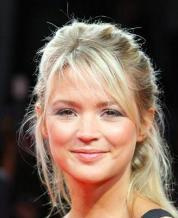

- Smiling 

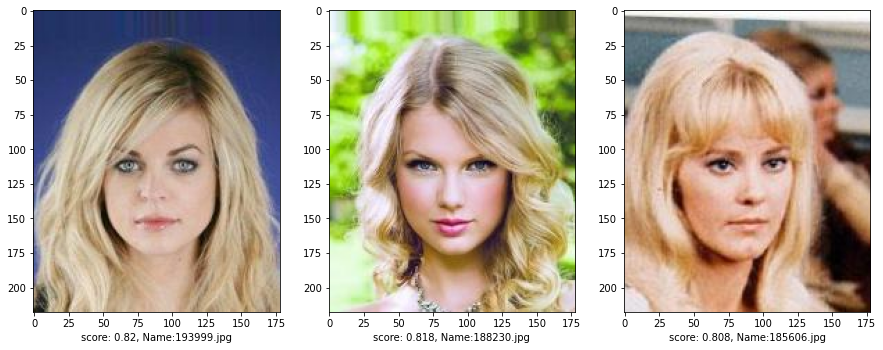

In [ ]:
mm_search("200196.jpg", "-", "Smiling", image_embeddings, image_names, 3)

query:


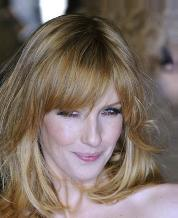

- Bangs 

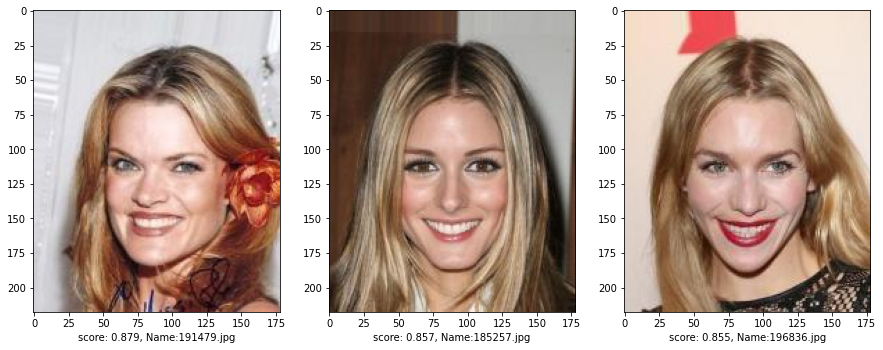

In [ ]:
mm_search("184861.jpg", "-", "Bangs", image_embeddings, image_names, 3)

query:


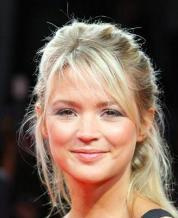

-
Young


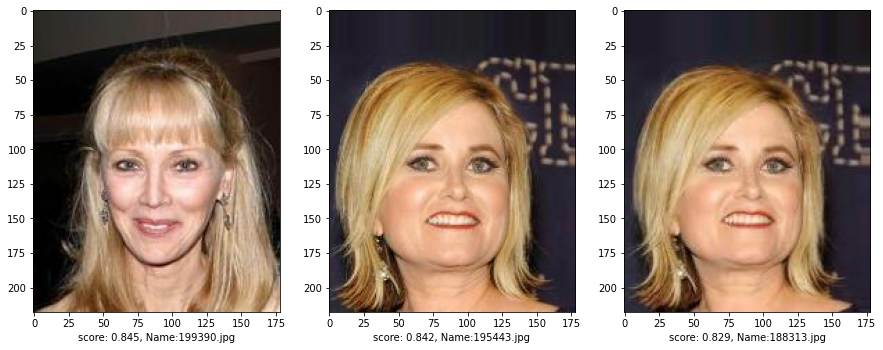

In [ ]:
mm_search("200196.jpg", "-", "Young", image_embeddings, image_names, 3)

query:


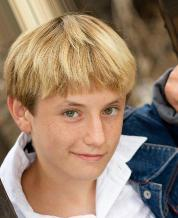

-
Blond Hair


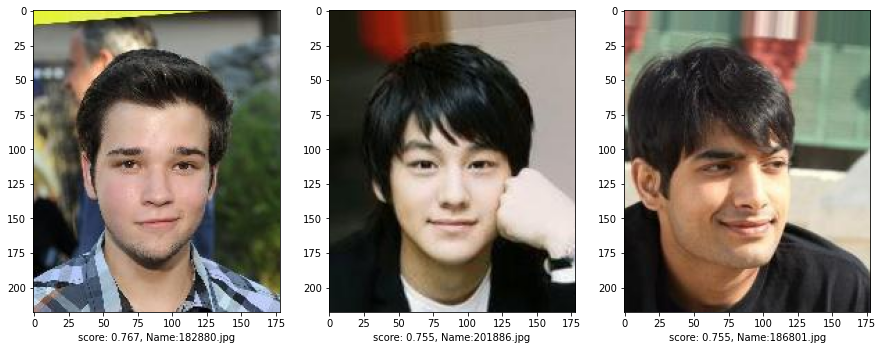

In [ ]:
mm_search("183490.jpg", "-", "Blond Hair", image_embeddings, image_names, 3)

query:


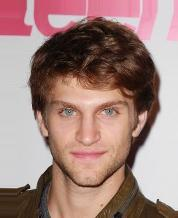

+
Eyeglasses


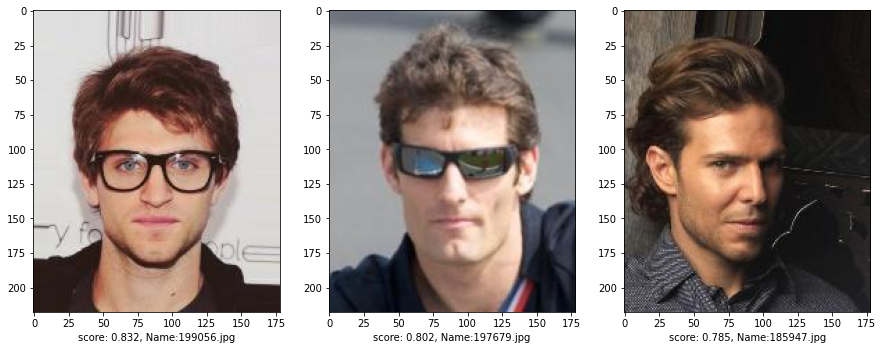

In [ ]:
mm_search("191181.jpg", "+", "Eyeglasses", image_embeddings, image_names, 3)

In [ ]:
from sentence_transformers import util

def search(query, image_embeddings, img_names, k=11):
    query_emb = model.text_encoder(query)
    query_emb = model.text_projection(query_emb)
    hits = util.semantic_search(query_emb, image_embeddings, top_k=k)[0]
    return [img_names[hit['corpus_id']] for hit in hits]

def get_results(df):
    from collections import defaultdict
    attr2Image = defaultdict(list)
    attr2Pred_Image = defaultdict(list)
    actuals = []
    predictions = []
    for index, row in tqdm(df.iterrows(), total=df.shape[0]):
        attr = row["pos"]
        if attr not in attr2Image:
            attr2Image["attr"] = test_df[test_df.pos == attr]["image_id"].to_list()
        actuals.append(attr2Image["attr"])
        if attr not in attr2Pred_Image:
           attr2Pred_Image["attr"] = search(attr, image_embeddings, image_names)

        predictions.append(attr2Pred_Image["attr"])

    return actuals, predictions

actuals, predictions = get_results(test_df)

  0%|          | 0/19962 [00:00<?, ?it/s]

## Performance

In [ ]:
def recall(actual, predicted, k):
    act_set = set(actual)
    pred_set = set(predicted[:k])
    result = round(len(act_set & pred_set) / float(len(act_set)), 2)
    return result

def recall_at_k(k=1):
    results = []
    for actual, predicted in zip(actuals, predictions):
         results.append(recall(actual, predicted, k))
    return results

R1 = recall_at_k(1)
R5 = recall_at_k(5)
R10 = recall_at_k(10)
Mean_R1 = sum(R1) / len(R1)
Mean_R5 = sum(R5) / len(R5)
Mean_R10 = sum(R10)/ len(R10)
print(Mean_R1)
print(Mean_R5)
print(Mean_R10)

0.026287446147680565
0.10605951307484189
0.16441589019136316


## Transformers Performance Training

In [ ]:
def recall(actual, predicted, k):
    act_set = set(actual)
    pred_set = set(predicted[:k])
    result = round(len(act_set & pred_set) / float(len(act_set)), 2)
    return result

def recall_at_k(k=1):
    results = []
    for actual, predicted in zip(actuals, predictions):
         results.append(recall(actual, predicted, k))
    return results

R1 = recall_at_k(1)
R5 = recall_at_k(5)
R10 = recall_at_k(10)
Mean_R1 = sum(R1) / len(R1)
Mean_R5 = sum(R5) / len(R5)
Mean_R10 = sum(R10)/ len(R10)
print(Mean_R1)
print(Mean_R5)
print(Mean_R10)

0.006657148582306378
0.03284640817553354
0.054980963831279484
